# 1. 사전 설정

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=False)
import os
from PIL import Image
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
%pip install mpi4py pyyaml h5py git-lfs

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 18.8 MB/s eta 0:00:00


In [3]:
# !git clone https://github.com/guillaumejs2403/ACE.git

In [4]:
%cd "/content/drive/MyDrive/Colab_Notebooks/"

workstation = "/content/drive/MyDrive/Colab_Notebooks/ACE/"
scripts_dir = os.path.join(workstation, "scripts")
results_dir = os.path.join(workstation, "Results")
datasets_dir = os.path.join(workstation, "CCKSY/CelebA-HQ-img")

%cd $workstation

/content/drive/MyDrive/Colab_Notebooks
/content/drive/MyDrive/Colab_Notebooks/ACE


- Smiling: \{1, -1\}
    - 1: 웃음
    - -1: 웃지 않음
- Young: \{1, -1\}
    - 1: 젊음
    - -1: 젊지 않음

# 2. DDPM 모델, Classifier 가중치 가져오기

## Diffusion 모델 가져오기

In [5]:
# !wget https://huggingface.co/guillaumejs2403/ACE/blob/main/bdd-diffusion.pt
# !wget https://huggingface.co/guillaumejs2403/ACE/resolve/main/celebahq-ddpm.pt
# !wget https://github.com/valeoai/STEEX/releases/download/v.0.1/checkpoints_decision_densenet.tar.gz

## Classifier 가중치 가져오기

In [6]:
# # decision densnet의 가중치 다운받아서 torch로 로드
# !wget https://github.com/valeoai/STEEX/releases/download/v.0.1/checkpoints_decision_densenet.tar.gz
# !tar -zxvf checkpoints_decision_densenet.tar.gz


# 데이터셋 준비

## 1. 원본 데이터셋
- CelebA dataset(kaggle)
- CelebAMask-HQ(kaggle)

In [7]:
# # Kaggle: celeba-dataset 다운로드 후 /content/celeba-dataset/에 압축 해제
# !curl -L -o /content/celeba-dataset.zip\
#   https://www.kaggle.com/api/v1/datasets/download/jessicali9530/celeba-dataset
# !unzip /content/celeba-dataset.zip -d /content/celeba-dataset

# # Kaggle: celebamaskhq 다운로드 후 /content/celebamaskhq_dataset/에 압축 해제
# !curl -L -o /content/celebamaskhq.zip\
#   https://www.kaggle.com/api/v1/datasets/download/ipythonx/celebamaskhq
# !unzip /content/celebamaskhq.zip -d /content/celebahqmask_dataset

# !cp /content/celeba-dataset/list_eval_partition.csv /content/celebahqmask_dataset/CelebAMask-HQ/

In [8]:
# # 데이터셋 확인
# celeba_dir = "/content/celeba-dataset/img_align_celeba/img_align_celeba/"
# celeba_img = os.listdir(celeba_dir)

# celebamhq_dir = "/content/celebahqmask_dataset/CelebAMask-HQ/CelebA-HQ-img/"
# celebamhq_img = os.listdir(celebamhq_dir)

# idx = np.random.randint(0, len(celebamhq_img))

# print(f"""[CelebA]
# 이미지 크기:  {Image.open(celeba_dir+celeba_img[idx]).size} \t 이미지 개수: {len(celeba_img)}""")
# print(f"""[CelebAMasked-HQ]
# 이미지 크기:  {Image.open(celebamhq_dir+celebamhq_img[idx]).size} \t 이미지 개수: {len(celebamhq_img)}""")

In [9]:
# print("CelebA")
# Image.open(celeba_dir+celeba_img[idx]).resize((128, 128))

In [10]:
# print("CelebAMask-HQ")
# Image.open(celebamhq_dir+celebamhq_img[idx]).resize((256, 256))

## 2. 별도 데이터 샘플

In [11]:
%ls

ACE_CCKSY.ipynb                       core/
ACE_백업/                             decision_densenet/
bdd100k-train-diffusion.py            environment.yaml
bdd-diffusion.pt                      eval_utils/
CCKSY/                                guided_diffusion/
celebahq-ddpm.pt                      LICENSE.md
celeba-train-diffusion.py             LINCENSES/
checkpoints_decision_densenet.tar.gz  main.py
compute_CD.py                         models/
compute_COUT.py                       Original/
compute_FID.sh                        postprocessing.py
compute_FVA.py                        README.md
compute_LPIPS.py                      Results/
compute_MNAC.py                       scripts/
compute_sFID.sh                       utils/
compute_SimSiamSimilarity.py


In [12]:
images_list = os.listdir(datasets_dir) # 이미지 이름 리스트
images_list.sort()
images_ndarray = [Image.open(os.path.join(datasets_dir, filename)) for filename in images_list]

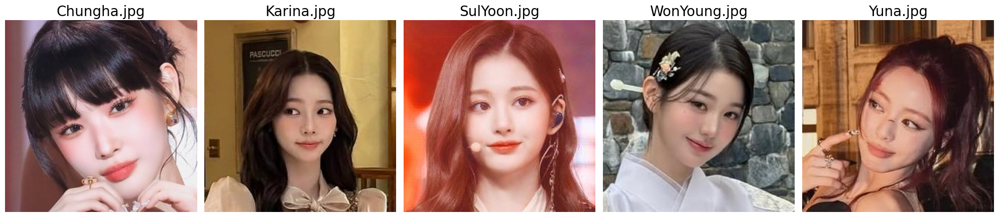

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 10))
for i in range(len(images_list)):
    axes[i].imshow(images_ndarray[i])
    axes[i].set_title(images_list[i], fontsize=20)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

# 결과

In [15]:
def ace_visualization(own_Results_dir=results_dir):
    # ACE 결과물의 기본 경로 설정
    base_explanation_dir = os.path.join(own_Results_dir, "explanation")

    # 시각화할 파일 쌍을 저장할 리스트
    # 각 요소는 (cf_path, sm_path, info_path, noise_path, instance_name) 형태
    file_info_list = []

    # 5개의 인스턴스만 가져오도록 제한
    MAX_INSTANCES = 5

    # explanation 디렉토리 내의 모든 하위 디렉토리를 순회하며 파일 수집
    for dirpath, dirnames, filenames in os.walk(base_explanation_dir):
        # 현재 디렉토리가 'CF' 디렉토리인지 확인
        if os.path.basename(dirpath) == "CF":

            # 현재 'CF' 디렉토리의 부모 디렉토리 경로 (예: .../CCF)
            parent_base_path = os.path.dirname(dirpath)

            # 대응되는 다른 디렉토리 경로 설정
            sm_dir = os.path.join(parent_base_path, "SM")
            info_dir = os.path.join(parent_base_path, "Info")
            noise_dir = os.path.join(parent_base_path, "Noise")

            # 현재 디렉토리(CF)에 있는 png 파일을 기준으로 순회
            for fname in sorted([f for f in filenames if f.endswith('.png')]):
                if len(file_info_list) >= MAX_INSTANCES:
                    break  # 5개 모두 찾았으면 순회 중단

                base_name = os.path.splitext(fname)[0]

                cf_path = os.path.join(dirpath, fname)
                sm_path = os.path.join(sm_dir, fname)
                info_path = os.path.join(info_dir, base_name + ".txt")
                noise_path = os.path.join(noise_dir, fname)

                # 네 가지 파일이 모두 존재해야 유효한 인스턴스로 간주
                if (os.path.exists(cf_path) and
                    os.path.exists(sm_path) and
                    os.path.exists(info_path) and
                    os.path.exists(noise_path)):

                    file_info_list.append((cf_path, sm_path, info_path, noise_path, base_name))

        if len(file_info_list) >= MAX_INSTANCES:
            break

    n_imgs = len(file_info_list)
    if n_imgs == 0:
        print(f"경로 {base_explanation_dir}에서 시각화할 파일을 찾을 수 없습니다.")
        return

    fig, axes = plt.subplots(nrows=4, ncols=n_imgs, figsize=(3 * n_imgs, 12))
    rows_title = ["CF (Result)", "SM (Saliency)", "Info (Text)", "Noise (Perturbation)"]

    if n_imgs == 1:
        axes = axes.reshape(-1, 1)

    for col_idx, (cf_path, sm_path, info_path, noise_path, base_name) in enumerate(file_info_list):

        # 1. CF (Counterfactual) 이미지
        axes[0, col_idx].imshow(Image.open(cf_path))
        axes[0, col_idx].axis('off')

        relative_path = os.path.relpath(os.path.dirname(os.path.dirname(cf_path)), base_explanation_dir)
        axes[0, col_idx].set_title(f"{relative_path}/{base_name}", fontsize=8)
        if col_idx == 0: axes[0, 0].set_ylabel(rows_title[0], rotation=90, fontsize=12, fontweight='bold', ha='right')

        axes[1, col_idx].imshow(Image.open(sm_path))
        axes[1, col_idx].axis('off')
        if col_idx == 0: axes[1, 0].set_ylabel(rows_title[1], rotation=90, fontsize=12, fontweight='bold', ha='right')

        with open(info_path, 'r') as f:
            info_text = f.read()

        axes[2, col_idx].text(0.5, 0.5, info_text, ha='center', va='center', fontsize=9, wrap=True)
        axes[2, col_idx].axis('off')
        axes[2, col_idx].set_facecolor("#f0f0f0")
        if col_idx == 0: axes[2, 0].set_ylabel(rows_title[2], rotation=90, fontsize=12, fontweight='bold', ha='right')

        axes[3, col_idx].imshow(Image.open(noise_path))
        axes[3, col_idx].axis('off')
        if col_idx == 0: axes[3, 0].set_ylabel(rows_title[3], rotation=90, fontsize=12, fontweight='bold', ha='right')

    for i in range(4):
        for j in range(n_imgs, 5):
            if j < axes.shape[1]:
                fig.delaxes(axes[i, j])

    plt.tight_layout()
    plt.show()

# experiment_name 폴더 이름 변경 함수
def experiment_name_rename(result_dir=results_dir, new_name="tmp_name"):
    target_dir = os.path.join(result_dir, "experiment_name")
    new_dir = os.path.join(result_dir, new_name)

    print(f"Chainging: {target_dir} to {new_dir}")

    if not os.path.exists(target_dir):
        print(f"error: no '{target_dir}' directory")
        print(os.listdir(result_dir))
        return False

    if os.path.exists(new_dir):
        print(f"error: Duplicated file name")
        print({new_dir})
        return False

    try:
        os.rename(target_dir, new_dir)
        print(f"Success: Changed file name 'experiment_name' to '{new_name}'.")
        print(os.listdir(result_dir))
        return True
    except Exception as e:
        print(f"effor: 디렉토리 이름 변경에 실패했습니다. ({e})")
        return False

## Original.1
- 가장 기본적인 세팅으로 실습

### Og.1 출력
`!bash ./scripts/Original1.sh`

```
Results:
n: 5
clean acc: 1.0
clean acc5: 1.0
explanation:
  cf: 1.0
  cf5: 1.0
  untargeted: 1.0
  untargeted5: 0.0
  l1: 0.00558307187166065
  l inf: 0.3782959818840027
pre-explanation:
  cf: 0.8
  cf5: 1.0
  untargeted: 0.8
  untargeted5: 0.0
  l1: 0.0034970676759257914
  l inf: 0.191372549533844
```

### Og.1 결과 시각화

In [16]:
ace_visualization(os.path.join(results_dir, "Og1"))

Output hidden; open in https://colab.research.google.com to view.

## My.1
- 여자 연예인 5명의 웃는 얼굴을 정색으로 바꾸는 설명 출력하기
    1. My1.sh 파일에서 DATAPATH를 변경


#### 파일 종속성 해결

In [17]:
# import os
# import pandas as pd


# target_docs_dir = "/content/drive/MyDrive/Colab_Notebooks/ACE/CCKSY"



#     files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
#     num_images = len(files)


#     print("running: list_eval_partition.csv 생성 중...")

#     df_partition = pd.DataFrame({
#         'image_id': files,
#         'partition': [2] * num_images  # 2 = Test set
#     })

#     csv_part_path = os.path.join(image_dir, "list_eval_partition.csv")
#     df_partition.to_csv(csv_part_path, index=False)
#     # 포맷: image_id,attr1,attr2,...
#     print("running: list_attr_celeba.csv 생성 중...")

#     attr_columns = "5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young".split()

#     df_attr = pd.DataFrame(index=range(num_images), columns=['image_id'] + attr_columns)
#     df_attr['image_id'] = files

#     for col in attr_columns:
#         df_attr[col] = -1

#     csv_attr_path = os.path.join(image_dir, "list_attr_celeba.csv")
#     df_attr.to_csv(csv_attr_path, index=False)

#     mapping_path = os.path.join(image_dir, "CelebA-HQ-to-CelebA-mapping.txt")
#     with open(mapping_path, "w") as f:
#         f.write("idx        orig_idx   orig_file\n")
#         for idx, fname in enumerate(files):
#             f.write(f"{idx:<10} {idx:<10} {fname}\n")


#     attr_header_str = " ".join(attr_columns)
#     dummy_labels_str = " ".join(["-1"] * 40)

#     anno_path = os.path.join(image_dir, "CelebAMask-HQ-attribute-anno.txt")
#     with open(anno_path, "w") as f:
#         f.write(f"{num_images}\n")
#         f.write(f"{attr_header_str}\n")
#         for fname in files:
#             f.write(f"{fname} {dummy_labels_str}\n")

# create_csv_dependency_files(target_docs_dir)

### My.1 출력

`!bash ./scripts/My1.sh`
```
Results:
n: 5
clean acc: 1.0
clean acc5: 1.0
explanation:
  cf: 1.0
  cf5: 1.0
  untargeted: 1.0
  untargeted5: 0.0
  l1: 0.004964319756254554
  l inf: 0.4759055316448212
pre-explanation:
  cf: 1.0
  cf5: 1.0
  untargeted: 1.0
  untargeted5: 0.0
  l1: 0.0014357467647641898
  l inf: 0.17568626999855042
  ```

### My.1 결과 시각화

In [18]:
ace_visualization(os.path.join(results_dir, "My1"))

Output hidden; open in https://colab.research.google.com to view.

## My.2

- My.1에서 자연스럽고 깨끗한 반사실적 설명(CE)이 생성되지 않음.
    1. CelbaHQ 데이터셋은 모든 이미지의 요소들이 한 좌표에 고정되어 있음. 하지만 샘플 이미지들은 조명, 배경, 객체의 크기, 위치 등이 다양함.
    2. CE가 원본과 얼마나 비슷해야 하는지를 뜻하는 `dist_l1`값과 변형의 강도를 조절하는 `attack_step`의 값에 영향을 받을 수 있음.
- 따라서 [1.]을 해결하기 위해 위치 정렬을 시도해보거나 [2.]를 해결하기 위해 .sh 파일의 값을 수정하여 실행함.
- 변경 사항
    - `--dist_l1 0.01`
    - `--timestep_respacing 25`

### My.2 출력
`!bash ./scripts/My2.sh`

```
Results:


n: 5
clean acc: 1.0
clean acc5: 1.0
explanation:
  cf: 0.2
  cf5: 1.0
  untargeted: 0.2
  untargeted5: 0.0
  l1: 0.002178241964429617
  l inf: 0.3930661678314209
pre-explanation:
  cf: 0.4
  cf5: 1.0
  untargeted: 0.4
  untargeted5: 0.0
  l1: 0.00039471822674386203
  l inf: 0.16784313023090364
  ```

### My.2 결과 시각화

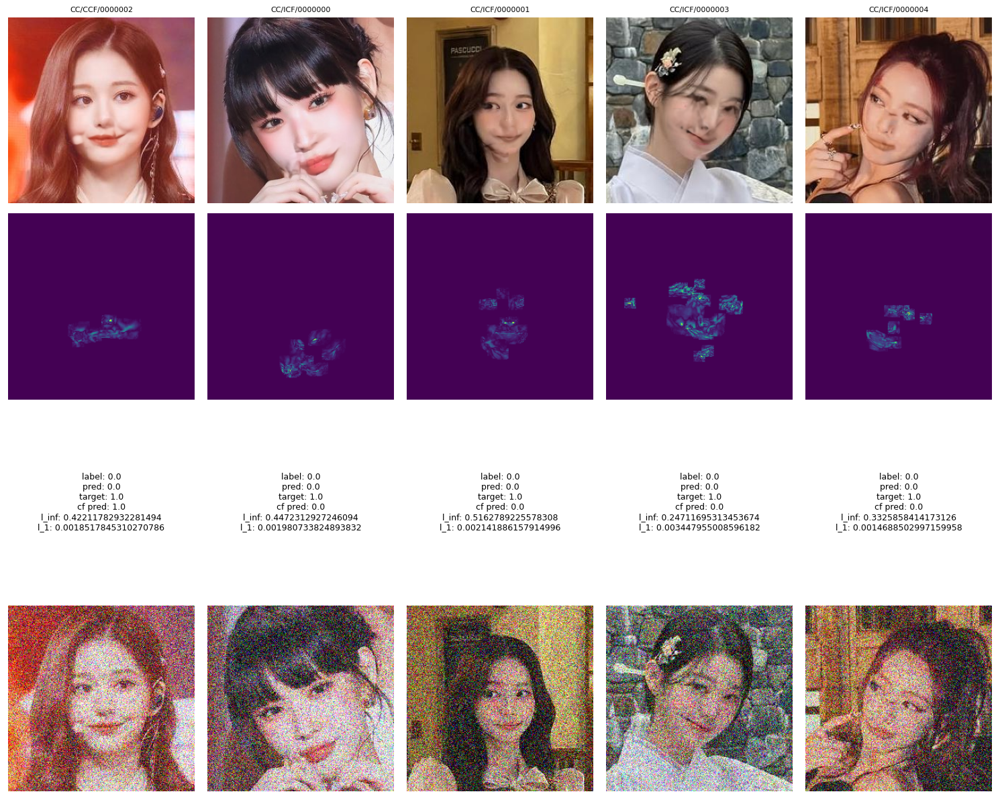

In [19]:
ace_visualization(os.path.join(results_dir, "My2"))

## My.3
- `--dist_l1 0.01`
- `--timestep_respacing 30`

### My.3 출력
`!bash ./scripts/My3.sh`

In [28]:
!bash ./scripts/My3.sh

Namespace(clip_denoised=True, batch_size=1, gpu='0', save_images=True, num_samples=5, cudnn_deterministic=False, model_path='/content/drive/MyDrive/Colab_Notebooks/ACE/celebahq-ddpm.pt', classifier_path='/content/drive/MyDrive/Colab_Notebooks/ACE/decision_densenet/celebamaskhq/checkpoint.tar', output_path='/content/drive/MyDrive/Colab_Notebooks/ACE', exp_name='experiment_name', seed=4, attack_method='PGD', attack_iterations=50, attack_epsilon=255, attack_step=1.0, attack_joint=True, attack_joint_checkpoint=False, attack_checkpoint_backward_steps=1, attack_joint_shortcut=False, dist_l1=0.01, dist_l2=0.0, dist_schedule='none', sampling_time_fraction=0.2, sampling_stochastic=True, sampling_inpaint=0.15, sampling_dilation=15, label_query=31, label_target=-1, image_size=256, data_dir='/content/drive/MyDrive/Colab_Notebooks/ACE/CCKSY', dataset='CelebAHQ', chunks=1, chunk=0, merge_chunks=False, num_channels=128, num_res_blocks=2, num_heads=4, num_heads_upsample=-1, num_head_channels=64, atten

### My.3 결과 시각화

Chainging: /content/drive/MyDrive/Colab_Notebooks/ACE/Results/experiment_name to /content/drive/MyDrive/Colab_Notebooks/ACE/Results/My3
Success: Changed file name 'experiment_name' to 'My3'.
['.ipynb_checkpoints', 'My1', 'Og1', 'My2', 'My3']


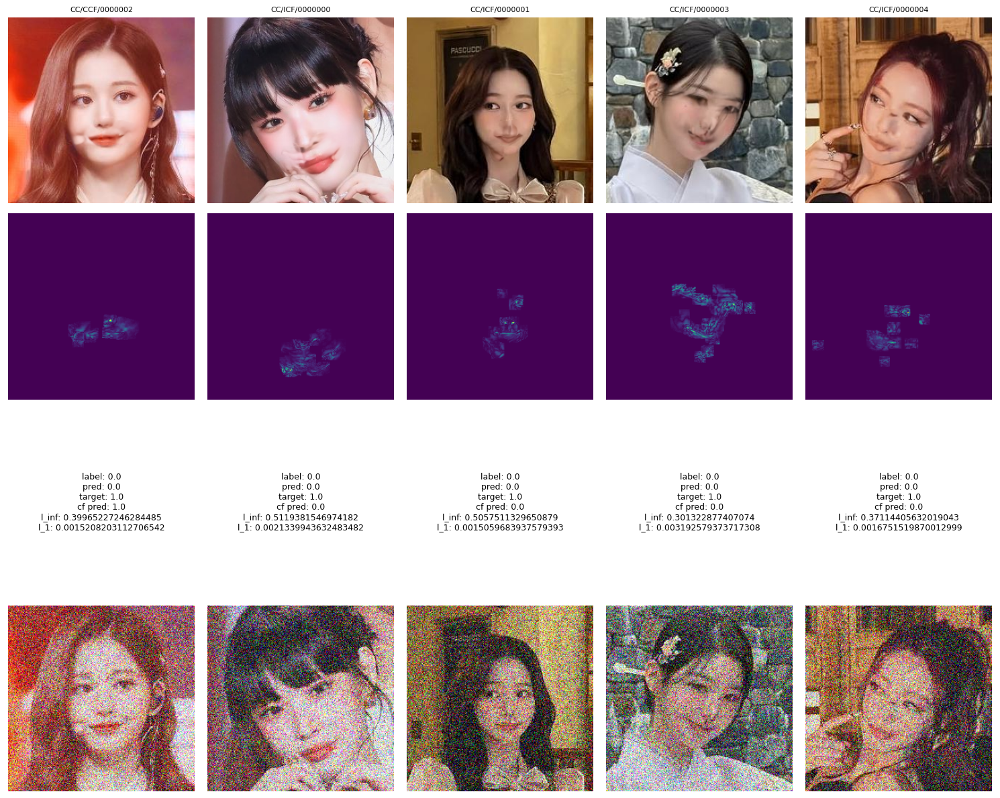

In [29]:
experiment_name_rename(new_name="My3")
ace_visualization(os.path.join(results_dir, "My3"))

## My.4
- `--dist_l1 0.01`
- `--timestep_respacing 35`

### My.4 출력
`!bash ./scripts/My4.sh`

```
Results:


n: 5
clean acc: 1.0
clean acc5: 1.0
explanation:
  cf: 0.2
  cf5: 1.0
  untargeted: 0.2
  untargeted5: 0.0
  l1: 0.002116873045451939
  l inf: 0.4186958968639374
pre-explanation:
  cf: 0.2
  cf5: 1.0
  untargeted: 0.2
  untargeted5: 0.0
  l1: 0.00036013961071148517
  l inf: 0.1662744998931885
```

### My.4 결과 시각화

Chainging: /content/drive/MyDrive/Colab_Notebooks/ACE/Results/experiment_name to /content/drive/MyDrive/Colab_Notebooks/ACE/Results/My4
Success: Changed file name 'experiment_name' to 'My4'.
['.ipynb_checkpoints', 'My1', 'Og1', 'My2', 'My3', 'My4']


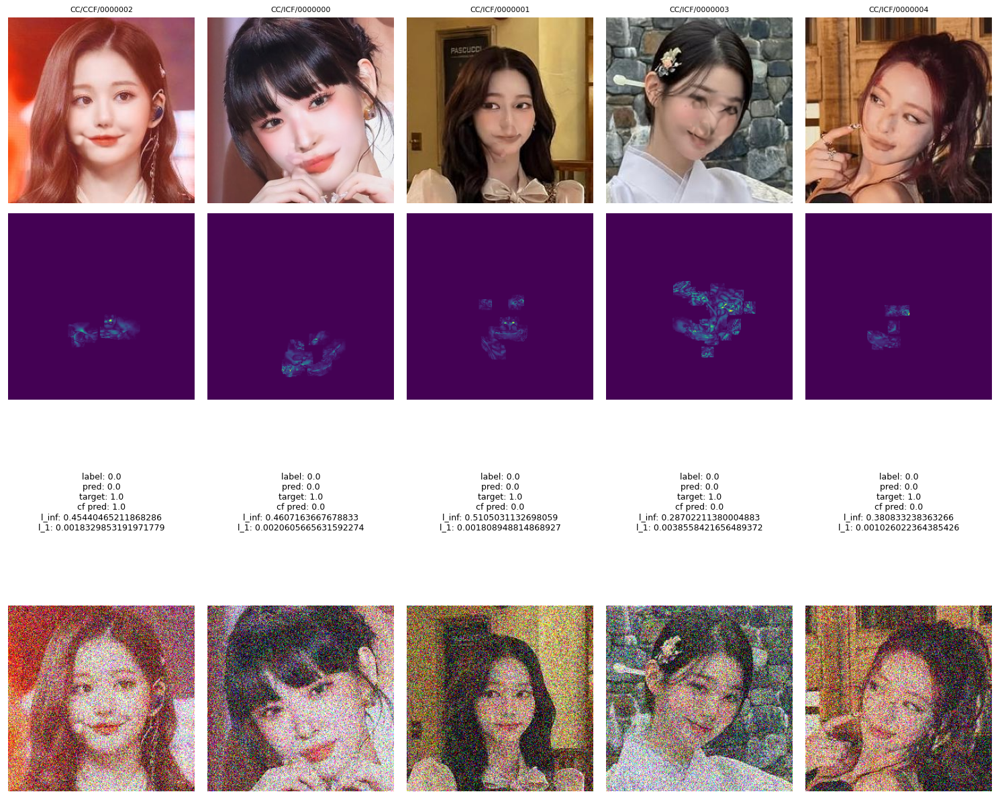

In [31]:
experiment_name_rename(new_name="My4")
ace_visualization(os.path.join(results_dir, "My4"))

## My.5
- `--dist_l1 0.01`
- `--timestep_respacing 38`

### My.5 출력
`!bash ./scripts/My5.sh`

```
Results:


n: 5
clean acc: 1.0
clean acc5: 1.0
explanation:
  cf: 0.2
  cf5: 1.0
  untargeted: 0.2
  untargeted5: 0.0
  l1: 0.002088604005984962
  l inf: 0.40133877992630007
pre-explanation:
  cf: 0.2
  cf5: 1.0
  untargeted: 0.2
  untargeted5: 0.0
  l1: 0.0003814300987869501
  l inf: 0.1694117546081543
```

### My.5 결과 시각화

Chainging: /content/drive/MyDrive/Colab_Notebooks/ACE/Results/experiment_name to /content/drive/MyDrive/Colab_Notebooks/ACE/Results/My5
Success: Changed file name 'experiment_name' to 'My5'.
['.ipynb_checkpoints', 'My1', 'Og1', 'My2', 'My3', 'My4', 'My5']


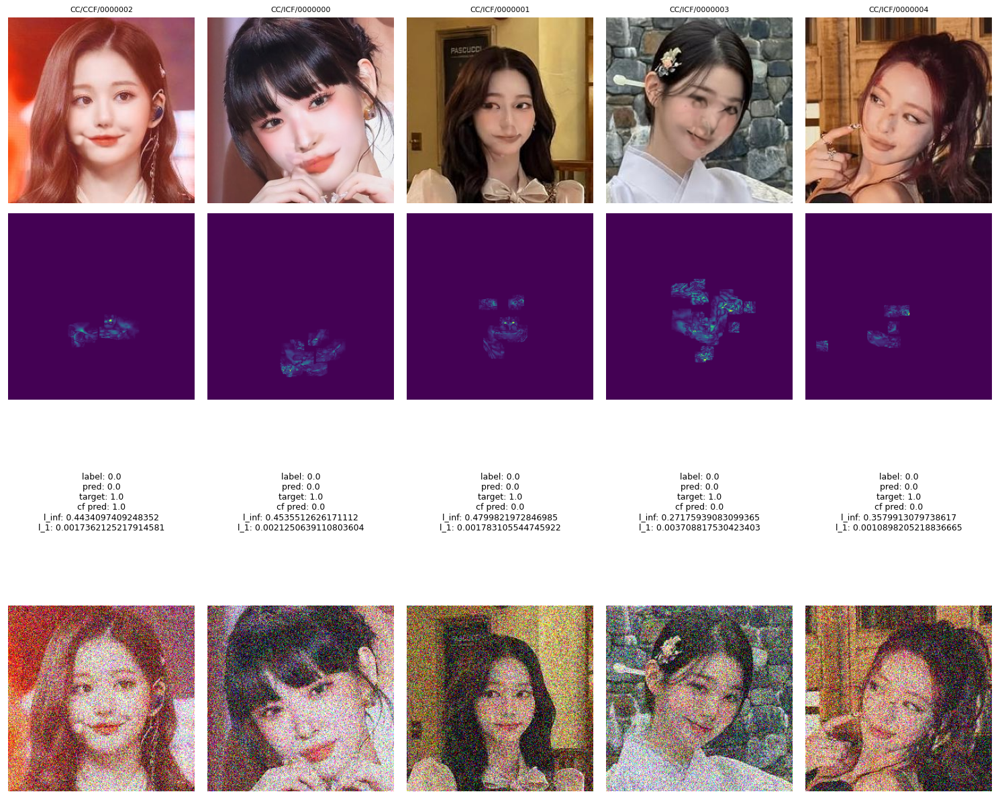

In [33]:
experiment_name_rename(new_name="My5")
ace_visualization(os.path.join(results_dir, "My5"))